# Task1:
### 1.Importing datasets and libraries

### 2.Checking datatypes

### 3.Statistical summary of data

### 4.Shape of the dataset

### 5.Checking null values 

In [1]:
#Importing libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
#importing dataset
banker=pd.read_excel(r'C:\Users\DELL\AppData\Local\Programs\Python\Python37\Scripts\Bank_Personal_Loan_Modelling.xlsx',sheet_name=1)

In [3]:
#first five training examples
banker.head()

,ID,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
0,1,25,1,49,91107,4,1.6,1,0,0,1,0,0,0
1,2,45,19,34,90089,3,1.5,1,0,0,1,0,0,0
2,3,39,15,11,94720,1,1.0,1,0,0,0,0,0,0
3,4,35,9,100,94112,1,2.7,2,0,0,0,0,0,0
4,5,35,8,45,91330,4,1.0,2,0,0,0,0,0,1


In [4]:
banker.tail(10)

,ID,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
4990,4991,55,25,58,95023,4,2.000000,3,219,0,0,0,0,1
4991,4992,51,25,92,91330,1,1.900000,2,100,0,0,0,0,1
4992,4993,30,5,13,90037,4,0.500000,3,0,0,0,0,0,0
4993,4994,45,21,218,91801,2,6.666667,1,0,0,0,0,1,0
4994,4995,64,40,75,94588,3,2.000000,3,0,0,0,0,1,0
4995,4996,29,3,40,92697,1,1.900000,3,0,0,0,0,1,0
4996,4997,30,4,15,92037,4,0.400000,1,85,0,0,0,1,0
4997,4998,63,39,24,93023,2,0.300000,3,0,0,0,0,0,0
4998,4999,65,40,49,90034,3,0.500000,2,0,0,0,0,1,0
4999,5000,28,4,83,92612,3,0.800000,1,0,0,0,0,1,1


In [5]:
#Checking datatypes
banker.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ID                  5000 non-null   int64  
 1   Age                 5000 non-null   int64  
 2   Experience          5000 non-null   int64  
 3   Income              5000 non-null   int64  
 4   ZIP Code            5000 non-null   int64  
 5   Family              5000 non-null   int64  
 6   CCAvg               5000 non-null   float64
 7   Education           5000 non-null   int64  
 8   Mortgage            5000 non-null   int64  
 9   Personal Loan       5000 non-null   int64  
 10  Securities Account  5000 non-null   int64  
 11  CD Account          5000 non-null   int64  
 12  Online              5000 non-null   int64  
 13  CreditCard          5000 non-null   int64  
dtypes: float64(1), int64(13)
memory usage: 547.0 KB


In [6]:
#Statistical summary of data
banker.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,5000.0,2500.500000,1443.520003,1.0,1250.75,2500.5,3750.25,5000.0
Age,5000.0,45.338400,11.463166,23.0,35.00,45.0,55.00,67.0
Experience,5000.0,20.104600,11.467954,-3.0,10.00,20.0,30.00,43.0
Income,5000.0,73.774200,46.033729,8.0,39.00,64.0,98.00,224.0
ZIP Code,5000.0,93152.503000,2121.852197,9307.0,91911.00,93437.0,94608.00,96651.0
Family,5000.0,2.396400,1.147663,1.0,1.00,2.0,3.00,4.0
CCAvg,5000.0,1.937913,1.747666,0.0,0.70,1.5,2.50,10.0
Education,5000.0,1.881000,0.839869,1.0,1.00,2.0,3.00,3.0
Mortgage,5000.0,56.498800,101.713802,0.0,0.00,0.0,101.00,635.0
Personal Loan,5000.0,0.096000,0.294621,0.0,0.00,0.0,0.00,1.0


#### Minimum Experience is given as -3,which is not possible.
#### Remaining all values are appropiate.

In [7]:
#Shape of the dataset
banker.shape

(5000, 14)

In [8]:
#Checking null values, all column names are also included in it.
banker.isnull().sum()

ID                    0
Age                   0
Experience            0
Income                0
ZIP Code              0
Family                0
CCAvg                 0
Education             0
Mortgage              0
Personal Loan         0
Securities Account    0
CD Account            0
Online                0
CreditCard            0
dtype: int64

<AxesSubplot:>

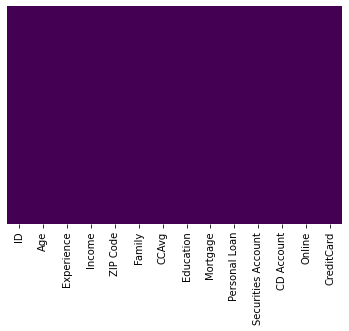

In [9]:
#plot the heatmap to check if there are null values.
sns.heatmap(banker.isnull(),yticklabels=False,cbar=False,cmap='viridis')

## Observation:
       No null values found.

# Task 2:
### Cleaning the data.

In [10]:
#Total number of training examples having negative experience value.
banker[banker['Experience'] < 0]['Experience'].count()

52

In [11]:
#Storing negative experienced examples into a list.
Valid_Exp = banker.loc[banker['Experience'] >0]
Invalid_Exp = banker.Experience < 0
column_name = 'Experience'
list = banker.loc[Invalid_Exp]['ID'].tolist()
Invalid_Exp.value_counts()

False    4948
True       52
Name: Experience, dtype: int64

In [12]:
#Assigning median value of all non-negative experience values to negative xperience values. 
for Exps in list:
    exp = banker['Experience'].median()
    banker.loc[banker.loc[np.where(banker['ID']==Exps)].index, 'Experience'] = exp

In [13]:
#number of negative experience training examples after cleaning the data.
banker[banker['Experience'] < 0]['Experience'].count()

0

In [14]:
banker.describe()

,ID,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.00000,5000.000000,5000.000000
mean,2500.500000,45.338400,20.327600,73.774200,93152.503000,2.396400,1.937913,1.881000,56.498800,0.096000,0.104400,0.06040,0.596800,0.294000
std,1443.520003,11.463166,11.253035,46.033729,2121.852197,1.147663,1.747666,0.839869,101.713802,0.294621,0.305809,0.23825,0.490589,0.455637
min,1.000000,23.000000,0.000000,8.000000,9307.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
25%,1250.750000,35.000000,11.000000,39.000000,91911.000000,1.000000,0.700000,1.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
50%,2500.500000,45.000000,20.000000,64.000000,93437.000000,2.000000,1.500000,2.000000,0.000000,0.000000,0.000000,0.00000,1.000000,0.000000
75%,3750.250000,55.000000,30.000000,98.000000,94608.000000,3.000000,2.500000,3.000000,101.000000,0.000000,0.000000,0.00000,1.000000,1.000000
max,5000.000000,67.000000,43.000000,224.000000,96651.000000,4.000000,10.000000,3.000000,635.000000,1.000000,1.000000,1.00000,1.000000,1.000000


NO inappropriate training examples,after cleaning the data.

# Task 3:
### EDA:
            1.Number of unique in each column?
            2.Number of people with zero mortgage?
            3.Number of people with zero credit card spending per month?
            4.Value counts of all categorical columns.
            5.Univariate and Bivariate analysis

In [15]:
#unique values in each column of dataset
banker.nunique()

ID                    5000
Age                     45
Experience              44
Income                 162
ZIP Code               467
Family                   4
CCAvg                  108
Education                3
Mortgage               347
Personal Loan            2
Securities Account       2
CD Account               2
Online                   2
CreditCard               2
dtype: int64

In [16]:
#number of people with zero mortgage.
banker[banker['Mortgage']==0]['Mortgage'].count()

3462

In [17]:
#number of people with CCAvg =0.
banker[banker['CCAvg']==0]['CCAvg'].count()

106

###### Value counts of all categorical columns.

In [18]:
banker['Education'].value_counts().to_frame()

,Education
1,2096
3,1501
2,1403


In [19]:
banker['Family'].value_counts().to_frame()

,Family
1,1472
2,1296
4,1222
3,1010


In [20]:
banker['Personal Loan'].value_counts().to_frame()

,Personal Loan
0,4520
1,480


In [21]:
banker['Securities Account'].value_counts().to_frame()

,Securities Account
0,4478
1,522


In [22]:
banker['CD Account'].value_counts().to_frame()

,CD Account
0,4698
1,302


In [23]:
banker['Online'].value_counts().to_frame()

,Online
1,2984
0,2016


In [24]:
banker['CreditCard'].value_counts().to_frame()

,CreditCard
0,3530
1,1470


## Univariate Analysis(PDF,CDF,Boxplot,Voilin plots,Distribution plots) & Bivariant Analysis:-

### 1.Distribution plot

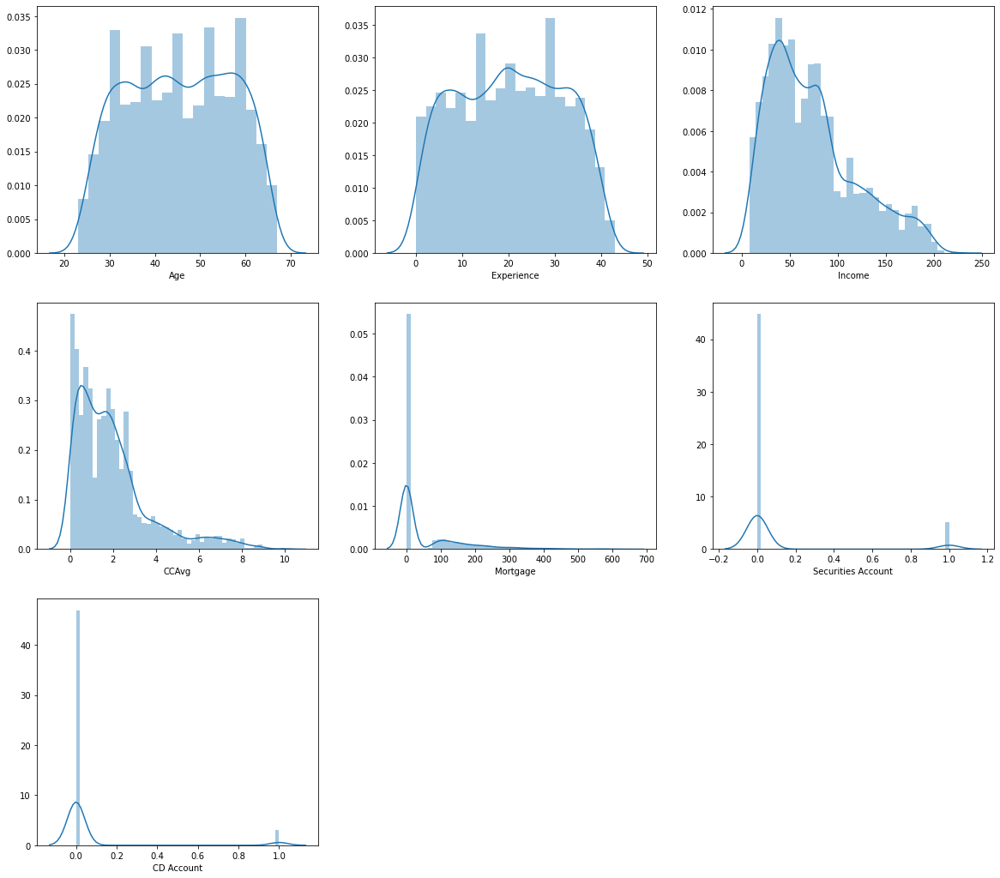

<Figure size 432x288 with 0 Axes>

In [25]:
colss=['Age','Experience','Income','CCAvg','Mortgage','Securities Account','CD Account']
k=3
j=0
plt.figure(figsize=(20,18))
for i in colss:
    plt.subplot(k,k,k*(j+1)//k)
    sns.distplot(banker[i])
    j=j+1
plt.show()
plt.tight_layout()

### Observations:
1.Age,Experience: They are symmetrically distributed.

2.Income,CCAvg: They have right skewed distribution.

3.Mortgage,Security Account:They have highly skewed distribution.

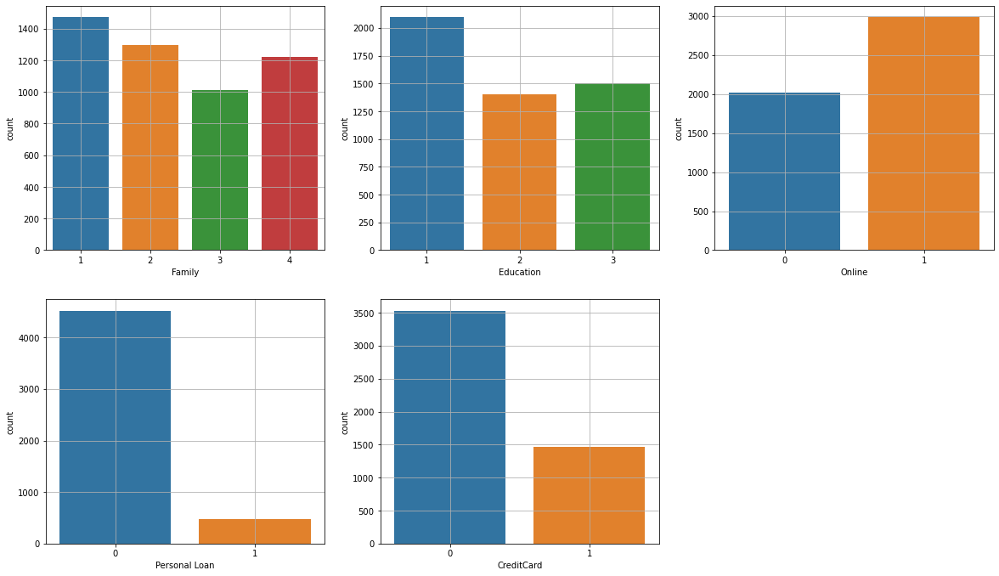

<Figure size 432x288 with 0 Axes>

In [26]:
#Plotting count plot for catagorical data.
colss1=['Family','Education','Online','Personal Loan','CreditCard']
k=3
j=0
plt.figure(figsize=(20,18))
for i in colss1:
    plt.subplot(k,k,k*(j+1)//k)
    sns.countplot(banker[i])
    j=j+1
    plt.grid(True)
plt.show()
plt.tight_layout()
    

Distribution plot for bivariant features.

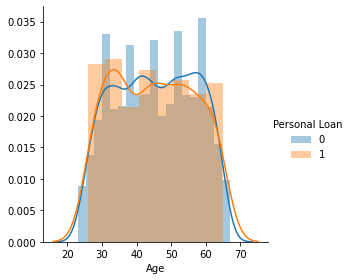

In [27]:
sns.FacetGrid(banker,hue="Personal Loan",height=4).map(sns.distplot,"Age").add_legend()

#### *From the above graph, we can observe that more people among the age 40 to 60 has not taken the personal loan.

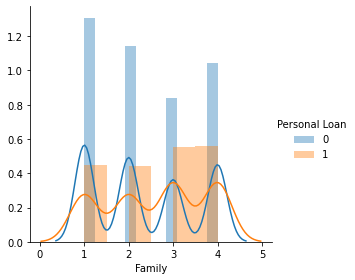

In [28]:
sns.FacetGrid(banker,hue="Personal Loan",height=4).map(sns.distplot,"Family").add_legend()

#### From the above graph ,we can say that family with 3 and 4 people comparatively had taken more personal loans than family with 1 and 2 people.

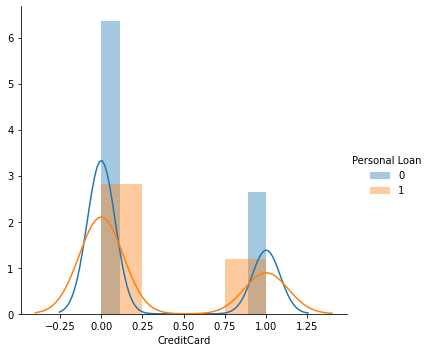

In [29]:
sns.FacetGrid(banker,hue="Personal Loan",height=5).map(sns.distplot,"CreditCard").add_legend()

##### From the above graph , we can conclude that the ratio between the ratios of  personal loan ,creditcard  taken and non taken examples respectively is (approx) 1

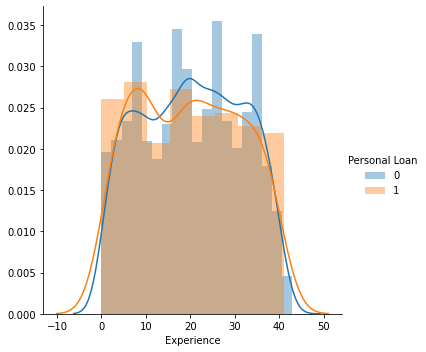

In [30]:
sns.FacetGrid(banker,hue="Personal Loan",height=5).map(sns.distplot,"Experience").add_legend()

##### From the above graph we can say that, percentage of low experienced people having personal loan is more than high experienced people having personal loan.

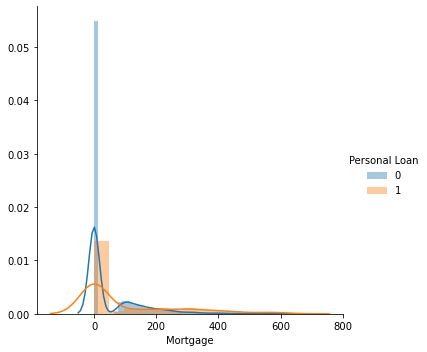

In [31]:
sns.FacetGrid(banker,hue="Personal Loan",height=5).map(sns.distplot,"Mortgage").add_legend()

##### highly skewed curve,personal loan is having the more examples with whose mortgage value above 200 .

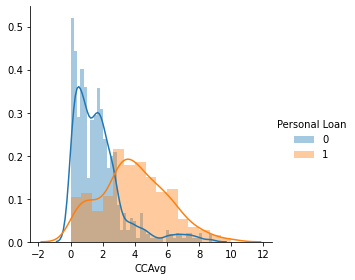

In [32]:
sns.FacetGrid(banker,hue="Personal Loan",height=4).map(sns.distplot,"CCAvg").add_legend()

##### Personal loan taken mostly by the people whose CCAvg is more than 3.

pdf= [0.0524 0.0974 0.1264 0.0958 0.1064 0.12   0.1048 0.1356 0.1008 0.0604]


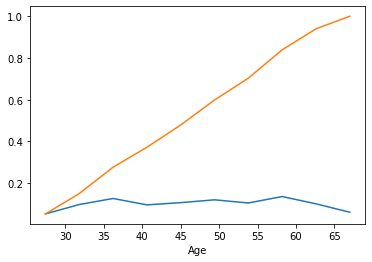

In [33]:
counts, bin_edges=np.histogram(banker['Age'],bins=10,density=True)
plt.xlabel('Age')
pdf=counts/(sum(counts))
print("pdf=",pdf);
cdf=np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf);
plt.plot(bin_edges[1:],cdf)

#### Plotting boxplots for bivariant analysis.

<AxesSubplot:xlabel='Personal Loan', ylabel='Mortgage'>

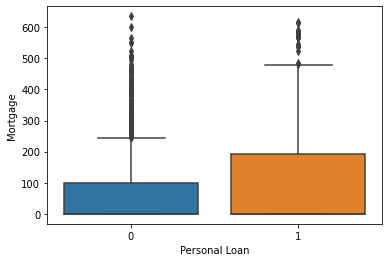

In [34]:
sns.boxplot(x='Personal Loan',y='Mortgage',data=banker)

<AxesSubplot:xlabel='Personal Loan', ylabel='Experience'>

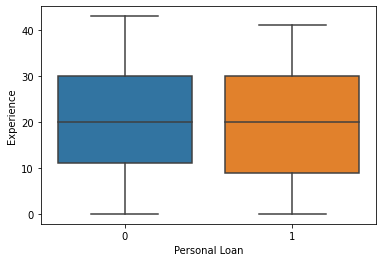

In [35]:
sns.boxplot(x='Personal Loan',y='Experience',data=banker)

<AxesSubplot:xlabel='Personal Loan', ylabel='CCAvg'>

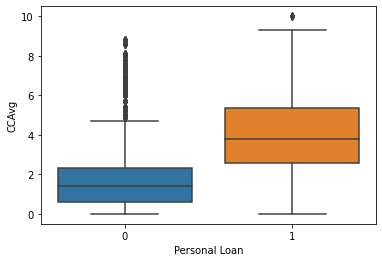

In [36]:
sns.boxplot(x='Personal Loan',y='CCAvg',data=banker)

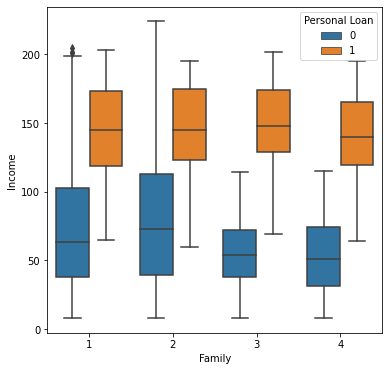

In [37]:
plt.figure(figsize=(6,6))
sns.boxplot(x='Family',y='Income',hue='Personal Loan',data=banker)
plt.show()

Personalloan is mostly taken by people with income (<100$) and with family members 1 or 2.

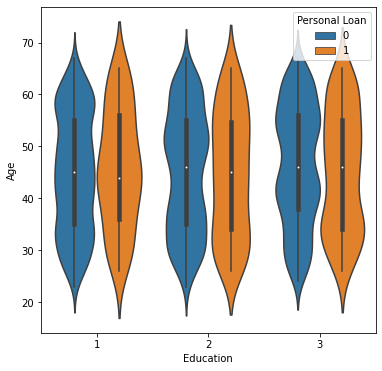

In [38]:
plt.figure(figsize=(6,6))
sns.violinplot(x='Education',y='Age',hue='Personal Loan',data=banker,size=8)
plt.show()

<AxesSubplot:xlabel='Education', ylabel='CCAvg'>

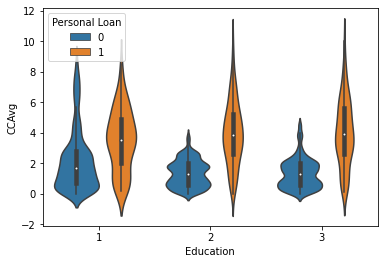

In [39]:
sns.violinplot(x='Education',y='CCAvg',hue='Personal Loan',data=banker,size=4)

Personal loan is taken by the people whose education level is (>=2) and they have ccavg (>4$).

<AxesSubplot:xlabel='Personal Loan', ylabel='Securities Account'>

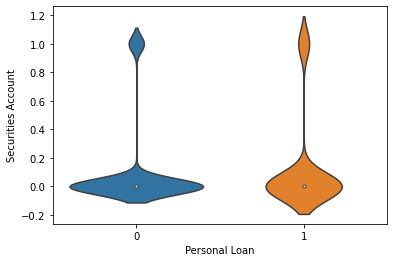

In [40]:
sns.violinplot(x='Personal Loan',y='Securities Account',data=banker,size=4)

<AxesSubplot:xlabel='Personal Loan', ylabel='Education'>

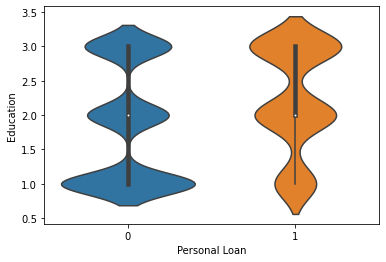

In [41]:
sns.violinplot(x='Personal Loan',y='Education',data=banker,size=4)

Personal loan is taken by the people whose education level is (>=2) .

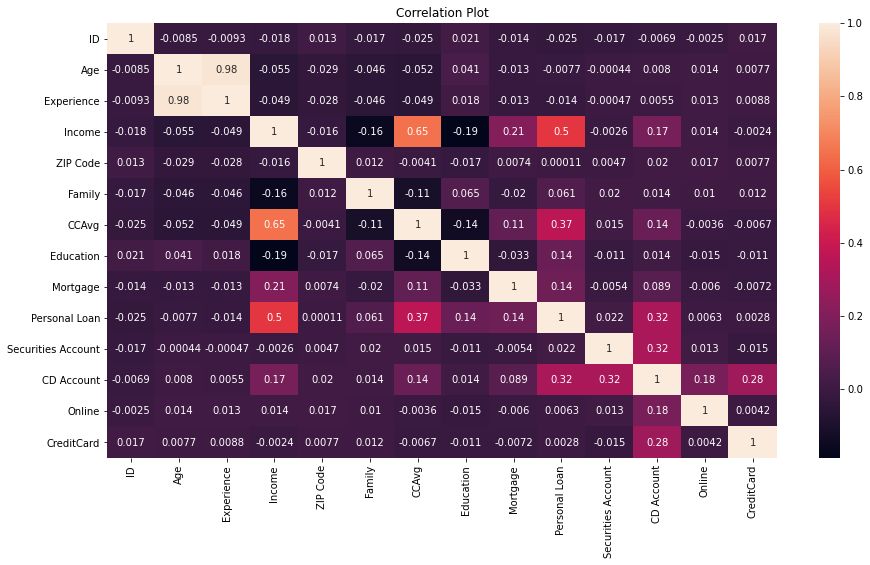

In [42]:
# Heatmap for Corelation:
corelate=banker.corr()
plt.figure(figsize=(15,8))
plt.title("Correlation Plot")
sns.heatmap(corelate,annot=True)
plt.show()

1.Experience and Age are highly correlated with eachother.
2.Income and CCAvg are moderately correlated with each other.
3.One feature among Exerience and age can be removed to avoid multi-colinearity issue

In [43]:
#Multivariant analysis.

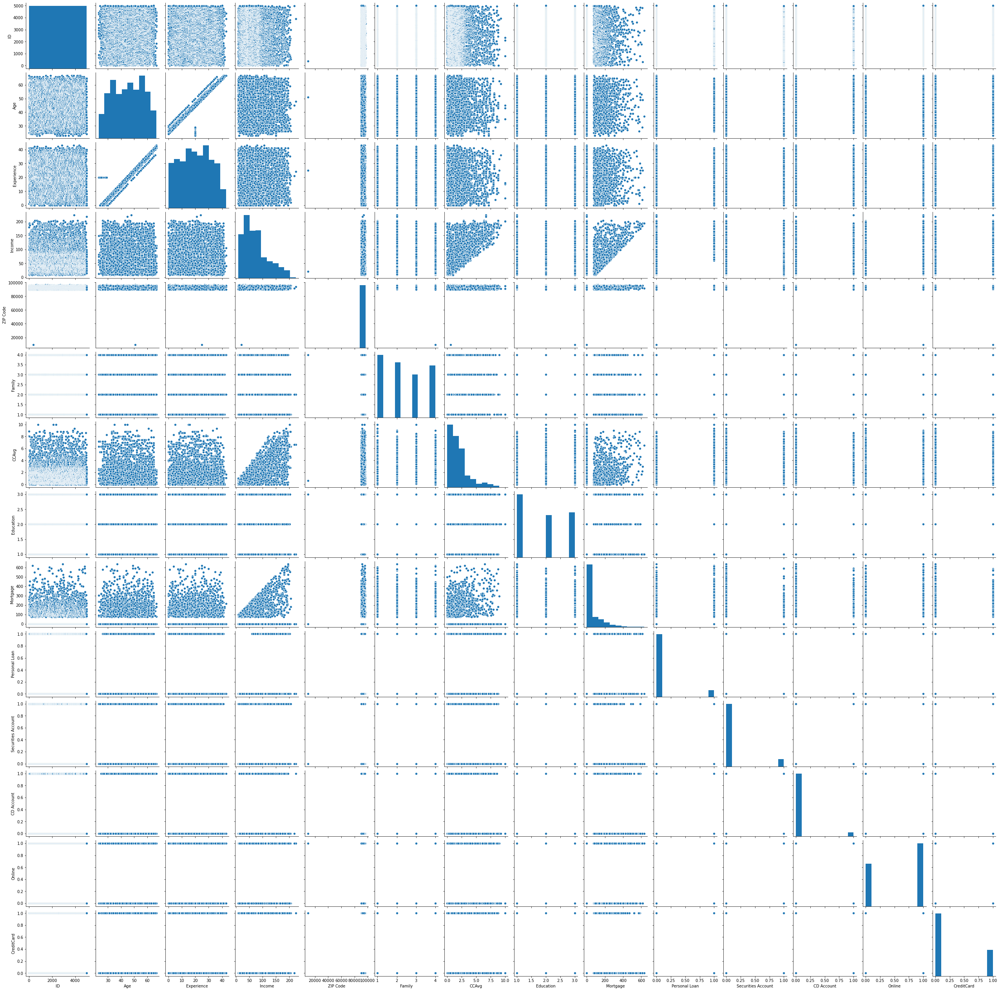

In [44]:
sns.pairplot(banker)

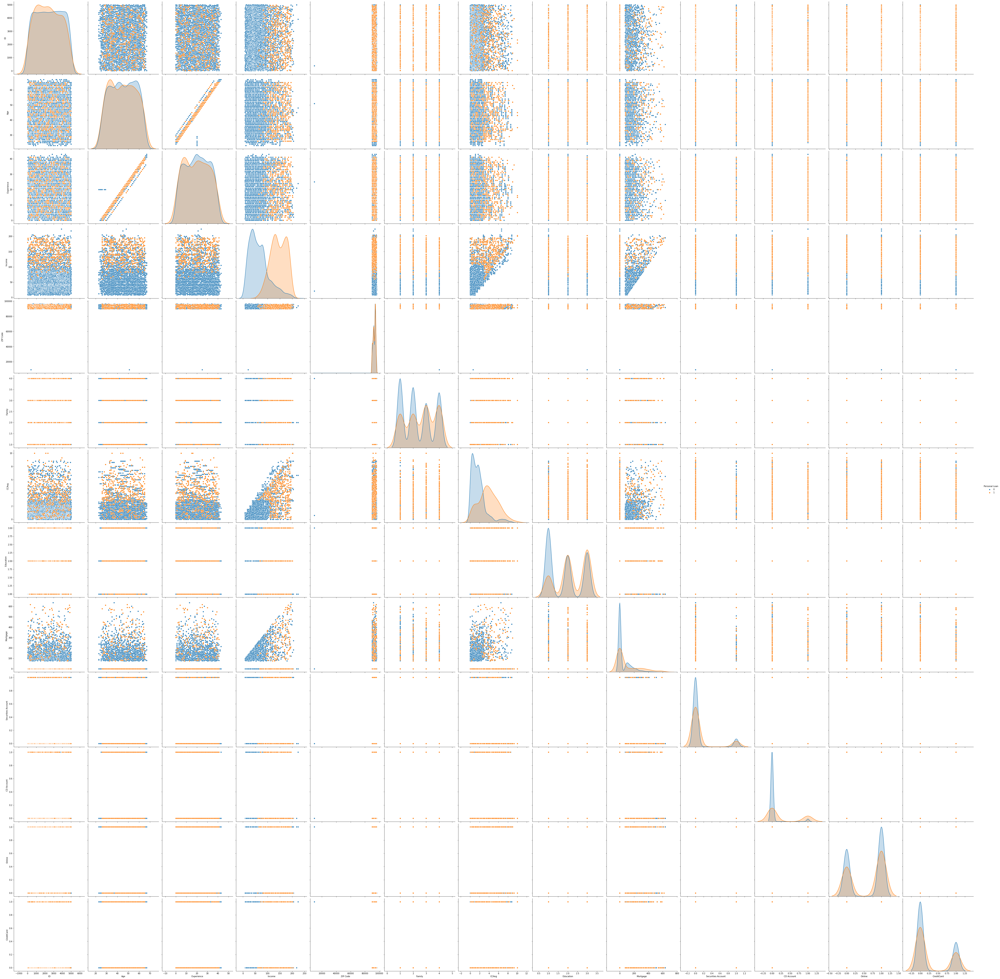

In [45]:
sns.pairplot(banker,hue="Personal Loan",height=5)
plt.show()

##### Scatter plotting

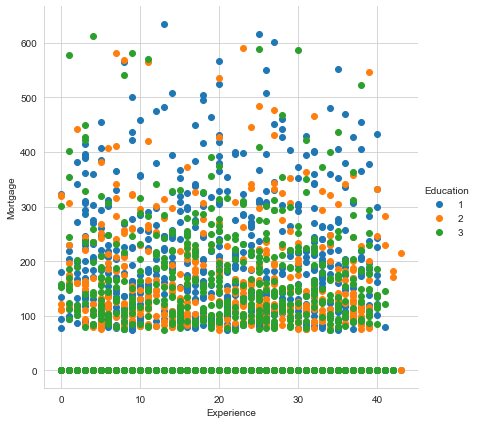

In [46]:
sns.set_style("whitegrid");
sns.FacetGrid(banker,hue="Education",height=6)\
.map(plt.scatter,"Experience","Mortgage")\
.add_legend()
plt.show()

##### Plotting  count plot of catagorical data for bivariant analysis

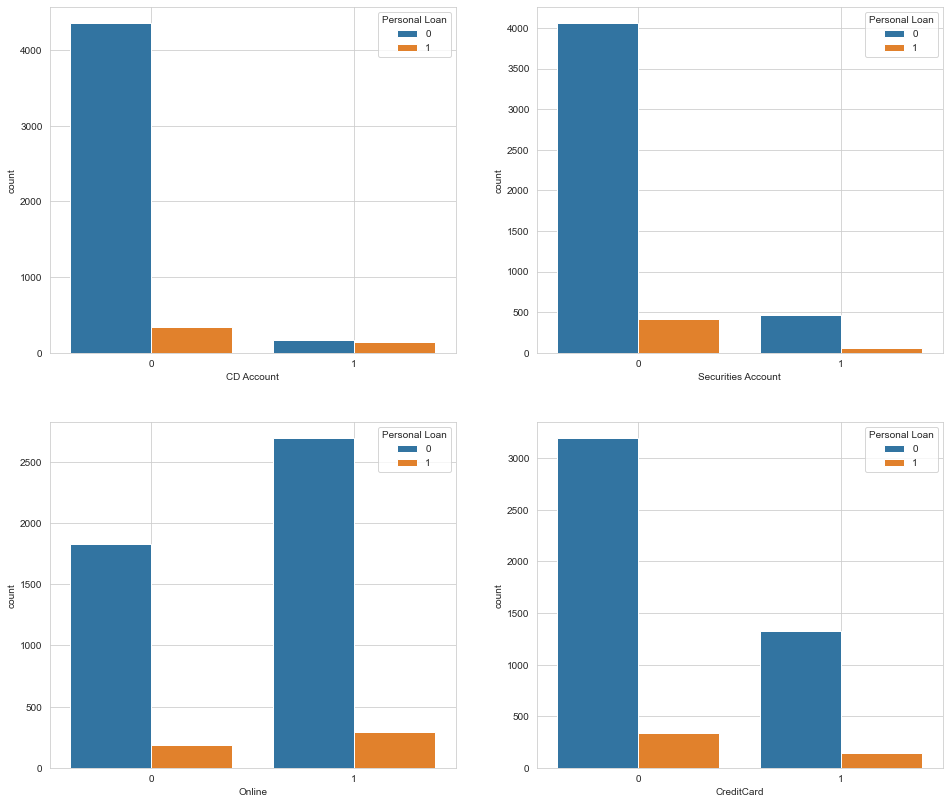

In [47]:
column_list=['CD Account','Securities Account','Online','CreditCard']
plt.figure(figsize=(16,14))
start=2;
i=0
for col in column_list:
    plt.subplot(2,start,start*(i+1)//start)
    sns.countplot(x=col,hue='Personal Loan',data=banker)
    i=i+1
    plt.grid(True)
plt.show()    


##### 1.People without the CD Accounts tend to have taken more Personal Loan comparitively.
##### 2.Very minimal number of people who have Securities Account have opted the Personal Loan.
##### 3.People with more Online accounts seem to take more Personal Loan.

#### Scatter plotting in 3D

In [48]:
import plotly.express as px
fig=px.scatter_3d(banker,x='Experience',y='Education',z='CreditCard',color='Personal Loan')
fig.show()

##### From above graph we can conclude that personal loan is taken mostly by :
1.people having credit card,

2.As education level increased

3.and experience less than 20years.

In [49]:
data_x=banker.loc[:,banker.columns!='Personal Loan']
data_y=banker[["Personal Loan"]]

# Task 4
### Apply necessary transformations for the feature variables


In [50]:
#Removing unneccesary columns
banker=banker.drop(['ID'],axis=1)
banker=banker.drop(['Experience'],axis=1)
banker=banker.drop(['ZIP Code'],axis=1)

In [51]:
banker.columns

Index(['Age', 'Income', 'Family', 'CCAvg', 'Education', 'Mortgage',
       'Personal Loan', 'Securities Account', 'CD Account', 'Online',
       'CreditCard'],
      dtype='object')

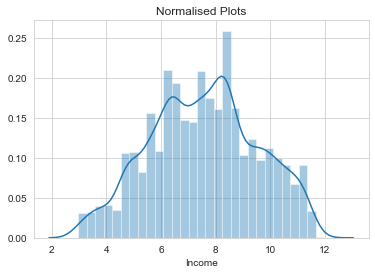

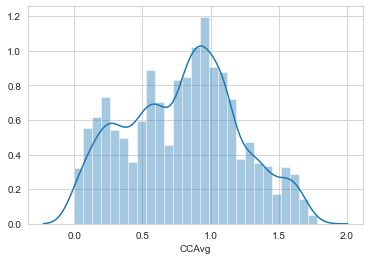

In [52]:
#Income and CCAvg become more normally distubuted than before.
from sklearn.preprocessing import PowerTransformer
pt=PowerTransformer(method="yeo-johnson",standardize=False)
pt.fit(banker["Income"].values.reshape(-1,1))
normalised_income=pt.transform(banker["Income"].values.reshape(-1,1))
plt.title("Normalised Plots")
plt.xlabel("Income")
sns.distplot(normalised_income);
plt.show()
pt=PowerTransformer(method="yeo-johnson",standardize=False)
pt.fit(banker["CCAvg"].values.reshape(-1,1))
normalised_ccavg=pt.transform(banker["CCAvg"].values.reshape(-1,1))
plt.xlabel("CCAvg")
sns.distplot(normalised_ccavg);

In [53]:
X=banker.drop(['Personal Loan'],axis=1)
y=banker['Personal Loan']

In [54]:
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler()
scaler.fit_transform(X)

array([[0.04545455, 0.18981481, 1.        , ..., 0.        , 0.        ,
        0.        ],
       [0.5       , 0.12037037, 0.66666667, ..., 0.        , 0.        ,
        0.        ],
       [0.36363636, 0.01388889, 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.90909091, 0.07407407, 0.33333333, ..., 0.        , 0.        ,
        0.        ],
       [0.95454545, 0.18981481, 0.66666667, ..., 0.        , 1.        ,
        0.        ],
       [0.11363636, 0.34722222, 0.66666667, ..., 0.        , 1.        ,
        1.        ]])

# Task 5:
###  Splitting the data into training and test sets.

In [55]:
#Splitting the dataset in 70:30 ratio, using stratify method.
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=0.3,stratify=data_y,random_state=0)
print(x_train.shape)
print(x_test.shape)

(3500, 10)
(1500, 10)


In [56]:
x_train.reset_index(drop=True,inplace=True);
x_test.reset_index(drop=True,inplace=True);
y_train.reset_index(drop=True,inplace=True);
y_test.reset_index(drop=True,inplace=True);

In [57]:
x_train.head()


,Age,Income,Family,CCAvg,Education,Mortgage,Securities Account,CD Account,Online,CreditCard
0,51,24,3,0.4,1,0,0,0,1,1
1,64,35,1,1.5,2,0,1,0,0,0
2,52,31,4,1.8,1,0,0,0,1,1
3,32,20,1,0.5,3,102,0,0,1,0
4,62,54,1,0.8,1,0,1,0,0,1


In [58]:
x_test.head()

,Age,Income,Family,CCAvg,Education,Mortgage,Securities Account,CD Account,Online,CreditCard
0,34,180,1,8.9,3,0,0,0,0,0
1,55,81,2,3.7,1,0,1,0,0,0
2,48,128,1,5.7,1,0,1,0,0,0
3,59,102,4,3.0,2,115,0,0,1,0
4,44,82,2,0.4,1,0,0,0,1,1


# Task 6
###  Using Logistic Regression model

In [59]:
#Train the logistic model.
import sklearn
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix,recall_score,precision_score,roc_auc_score,accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
logreg = LogisticRegression(max_iter=1000,random_state=0)
logreg.fit(x_train, y_train)


LogisticRegression(max_iter=1000, random_state=0)

In [60]:
y_pred = logreg.predict(x_test)
print('Accuracy of logistic regression classifier on test set: {:.3f}'.format(logreg.score(x_test, y_test)))

Accuracy of logistic regression classifier on test set: 0.949


# Task 7
1. Precision-Recall curve
2. ROC-AUC curve
3. Precision
4. Recall
5. Accuracy
6. Log loss
7. Area under curve for both ROC and precision-recall curves
8. Classification Report
9. Confusion Matrix

In [61]:
from sklearn.model_selection import cross_val_score
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score, classification_report, precision_score, recall_score
from sklearn.metrics import confusion_matrix, precision_recall_curve, roc_auc_score, roc_curve, auc, log_loss

In [62]:
y_predict_prob = logreg.predict_proba(x_test)[:,1]

[fpr,tpr,thr] = roc_curve(y_test, y_predict_prob)
precision, recall, thresholds = precision_recall_curve(y_test,y_predict_prob)

Text(0.5, 1.0, 'ROC curve for logistic regression')

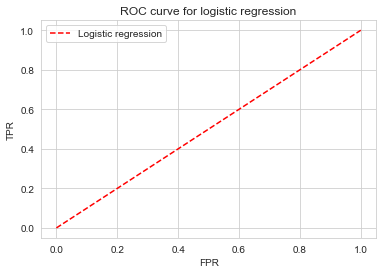

In [63]:
plt.plot([0, 1], [0, 1], 'r--')
plt.legend(['Logistic regression', 'Random chance'])
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve for logistic regression')

Logistic: f1=0.698 auc=0.816


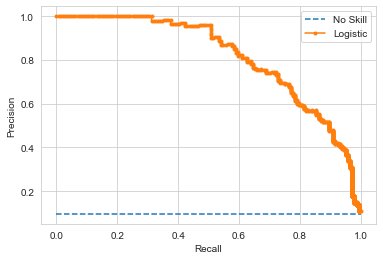

In [64]:
lr_probs = logreg.predict_proba(x_test)
# keep probabilities for the positive outcome only
lr_probs = lr_probs[:, 1]
yhat = logreg.predict(x_test)
lr_precision, lr_recall, _ = precision_recall_curve(y_test, lr_probs)
lr_f1, lr_auc = f1_score(y_test, yhat), auc(lr_recall, lr_precision)
print('Logistic: f1=%.3f auc=%.3f' % (lr_f1, lr_auc))
no_skill = len(y_test[y_test==1]) / len(y_test)
plt.plot([0, 1], [no_skill, no_skill], linestyle='--', label='No Skill')
plt.plot(lr_recall, lr_precision, marker='.', label='Logistic')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend()
plt.show()

No Skill: ROC AUC=0.500
Logistic: ROC AUC=0.956


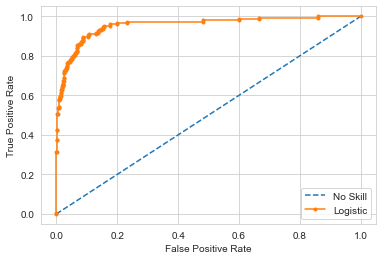

In [65]:
ns_probs = [0 for _ in range(len(y_test))]
lr_probs = logreg.predict_proba(x_test)
lr_probs = lr_probs[:, 1]
ns_auc = roc_auc_score(y_test, ns_probs)
lr_auc = roc_auc_score(y_test, lr_probs)
print('No Skill: ROC AUC=%.3f' % (ns_auc))
print('Logistic: ROC AUC=%.3f' % (lr_auc))
ns_fpr, ns_tpr, _ = roc_curve(y_test, ns_probs)
lr_fpr, lr_tpr, _ = roc_curve(y_test, lr_probs)
plt.plot(ns_fpr, ns_tpr, linestyle='--', label='No Skill')
plt.plot(lr_fpr, lr_tpr, marker='.', label='Logistic')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()

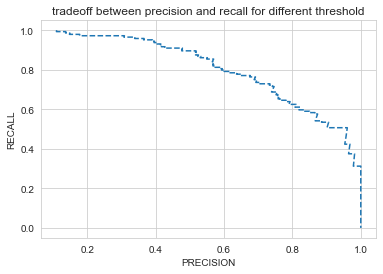

In [66]:
plt.plot(precision, recall, '--')
plt.xlabel('PRECISION')
plt.ylabel('RECALL')
plt.title('Precision-recall curve')
plt.title("tradeoff between precision and recall for different threshold")
plt.show()


Text(0.5, 1.0, 'ROC curve for logistic regression')

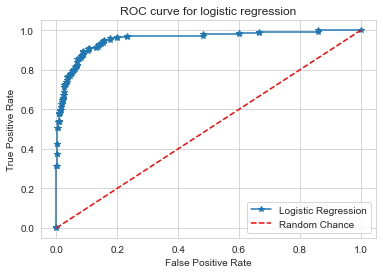

In [67]:
plt.plot(fpr, tpr, '*-')
plt.plot([0, 1], [0, 1], 'r--')
plt.legend(['Logistic Regression', 'Random Chance'])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curve for logistic regression')

In [68]:
print('precision:',precision_score(y_test,y_pred))
print('recall:',recall_score(y_test,y_pred))
print('Accuracy: ',accuracy_score(y_test, y_pred))
print('Log loss: ',log_loss(y_test,y_pred))
print('Auc of ROC Curve: ',auc(fpr,tpr))
print('Auc of precision & recall: ',auc(recall,precision))

precision: 0.8148148148148148
recall: 0.6111111111111112
Accuracy:  0.9493333333333334
Log loss:  1.7499753319745444
Auc of ROC Curve:  0.9563718862667978
Auc of precision & recall:  0.8157979335898066


In [69]:
target_names = ['class 0', 'class 1']
print(classification_report(y_test, y_pred, target_names=target_names))

              precision    recall  f1-score   support

     class 0       0.96      0.99      0.97      1356
     class 1       0.81      0.61      0.70       144

    accuracy                           0.95      1500
   macro avg       0.89      0.80      0.84      1500
weighted avg       0.95      0.95      0.95      1500



In [70]:
confusion_matrix(y_test, y_pred)

array([[1336,   20],
       [  56,   88]], dtype=int64)

In [71]:
np_train_x=x_train.values
np_train_y=y_train.values
np_test_x=x_test.values
np_test_y=y_test.values

In [72]:
np_test_y.shape

(1500,)

In [73]:
cls_1=LogisticRegression(random_state=0,max_iter=1000)


cls_1.fit(np_train_x,np_train_y.ravel())
pred_1_test_x=cls_1.predict(np_test_x)
pred_1_train_x=cls_1.predict(np_train_x)
acc_1_train_x=accuracy_score(np_train_y,pred_1_train_x)
acc_1_test_x=accuracy_score(np_test_y,pred_1_test_x)
print("Logistic Regression accuracy on np_train_x:{:.4f}".format(acc_1_train_x))
print("Logistic Regression accuracy on np_test_x:{:.4f}".format(acc_1_test_x))

Logistic Regression accuracy on np_train_x:0.9523
Logistic Regression accuracy on np_test_x:0.9493


In [74]:
def draw_cm(actual,predicted):
    cm=confusion_matrix(actual,predicted)
    sns.heatmap(cm,annot=True,fmt='.2f',xticklabels=[0,1],yticklabels=[0,1])
    plt.ylabel('Observed')
    plt.xlabel('Predicted')
    plt.show()

CONFUSION MATRIX OF LOGISTIC REGRESSION


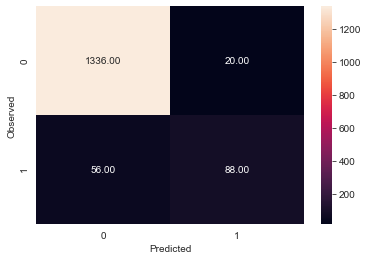

None


In [75]:
print('CONFUSION MATRIX OF LOGISTIC REGRESSION')
print(draw_cm(np_test_y,pred_1_test_x.reshape(-1,1)))

In [76]:
print("RECALL: ",recall_score(np_test_y,pred_1_test_x))
print()
print("PRECISION: ",precision_score(np_test_y,pred_1_test_x))
print()
print("F1 SCORE: ",f1_score(np_test_y,pred_1_test_x))
print()
print("Roc Auc Score: ",roc_auc_score(np_test_y,pred_1_test_x))
print()
print('Auc of ROC Curve: ',auc(fpr,tpr))
print()
print('Auc of precision & recall: ',auc(recall,precision))

RECALL:  0.6111111111111112

PRECISION:  0.8148148148148148

F1 SCORE:  0.6984126984126984

Roc Auc Score:  0.798180924287119

Auc of ROC Curve:  0.9563718862667978

Auc of precision & recall:  0.8157979335898066


# Task 8:
##### Various Classification Algorithms include:
        1.Decision Tree
        2.Random Forest
        3.Naive bayes
        4.KNN
        Models have been trained and found the accuracy of each model.


In [77]:
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier

In [78]:
cls_2=DecisionTreeClassifier(random_state=0,max_depth=8)
cls_3=RandomForestClassifier(random_state=0,n_estimators=500,max_depth=8)
cls_4=KNeighborsClassifier(n_neighbors=5)
cls_5=NaiveBayes=GaussianNB()

cls_2.fit(np_train_x,np_train_y.ravel())
pred_2_test_x=cls_2.predict(np_test_x)
pred_2_train_x=cls_2.predict(np_train_x)
acc_2_train_x=accuracy_score(np_train_y,pred_2_train_x)
acc_2_test_x=accuracy_score(np_test_y,pred_2_test_x)
y_predict_prob2= cls_2.predict_proba(np_test_x)[:,1]
[fpr2,tpr2,thr2] = roc_curve(np_test_y, y_predict_prob2)
precision2, recall2, thresholds2 = precision_recall_curve(np_test_y,y_predict_prob2)
print("Decision Tree Classifier accuracy on np_train_x:{:.4f}".format(acc_2_train_x))
print("Decision Tree Classifier accuracy on np_test_x:{:.4f}".format(acc_2_test_x))

cls_3.fit(np_train_x,np_train_y.ravel())
pred_3_test_x=cls_3.predict(np_test_x)
pred_3_train_x=cls_3.predict(np_train_x)
acc_3_train_x=accuracy_score(np_train_y,pred_3_train_x)
acc_3_test_x=accuracy_score(np_test_y,pred_3_test_x)
y_predict_prob3= cls_3.predict_proba(np_test_x)[:,1]
[fpr3,tpr3,thr3] = roc_curve(np_test_y, y_predict_prob3)
precision3, recall3, thresholds3 = precision_recall_curve(np_test_y,y_predict_prob3)
print("Random Forest Classifier accuracy on np_train_x:{:.4f}".format(acc_3_train_x))
print("Random Forest Classifier accuracy on np_test_x:{:.4f}".format(acc_3_test_x))

cls_4.fit(np_train_x,np_train_y.ravel())
pred_4_test_x=cls_4.predict(np_test_x)
pred_4_train_x=cls_4.predict(np_train_x)
acc_4_train_x=accuracy_score(np_train_y,pred_4_train_x)
acc_4_test_x=accuracy_score(np_test_y,pred_4_test_x)
y_predict_prob4= cls_4.predict_proba(np_test_x)[:,1]
[fpr4,tpr4,thr4] = roc_curve(np_test_y, y_predict_prob4)
precision4, recall4, thresholds4 = precision_recall_curve(np_test_y,y_predict_prob4)
print("KNeighbors Classifier accuracy on np_train_x:{:.4f}".format(acc_4_train_x))
print("KNeighbors Classifier accuracy on np_test_x:{:.4f}".format(acc_4_test_x))

cls_5.fit(np_train_x,np_train_y.ravel())
pred_5_test_x=cls_5.predict(np_test_x)
pred_5_train_x=cls_5.predict(np_train_x)
acc_5_train_x=accuracy_score(np_train_y,pred_5_train_x)
acc_5_test_x=accuracy_score(np_test_y,pred_5_test_x)
y_predict_prob5= cls_5.predict_proba(np_test_x)[:,1]
[fpr5,tpr5,thr5] = roc_curve(np_test_y, y_predict_prob5)
precision5, recall5, thresholds5 = precision_recall_curve(np_test_y,y_predict_prob5)
print("NAIVE BAYES accuracy on np_train_x:{:.4f}".format(acc_5_train_x))
print("NAIVE BAYES accuracy on np_test_x:{:.4f}".format(acc_5_test_x))

Decision Tree Classifier accuracy on np_train_x:0.9954
Decision Tree Classifier accuracy on np_test_x:0.9840
Random Forest Classifier accuracy on np_train_x:0.9949
Random Forest Classifier accuracy on np_test_x:0.9887
KNeighbors Classifier accuracy on np_train_x:0.9403
KNeighbors Classifier accuracy on np_test_x:0.9193
NAIVE BAYES accuracy on np_train_x:0.8823
NAIVE BAYES accuracy on np_test_x:0.8867


### Decision Tree Classifier Algorithm

In [79]:
decisiontreeclasifier_obj=DecisionTreeClassifier()
decisiontreeclasifier_obj.fit(x_train,y_train)
y_pred = decisiontreeclasifier_obj.predict(x_test)

In [80]:
#Evaluating Model
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.982


In [81]:
decisiontreeclasifier_obj.predict(x_test)


array([1, 0, 0, ..., 0, 0, 0], dtype=int64)

CONFUSION MATRIX OF DECISION TREE


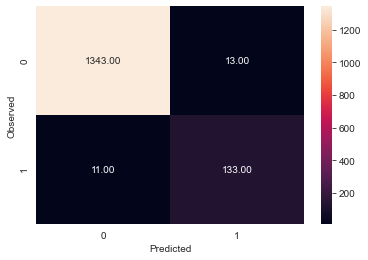

None


In [82]:
print('CONFUSION MATRIX OF DECISION TREE')
print(draw_cm(np_test_y,pred_2_test_x))

In [83]:
print("RECALL: ",recall_score(np_test_y,pred_2_test_x))
print()
print("PRECISION: ",precision_score(np_test_y,pred_2_test_x))
print()
print("F1 SCORE: ",f1_score(np_test_y,pred_2_test_x))
print()
print("Roc Auc Score: ",roc_auc_score(np_test_y,pred_2_test_x))
print()
print('Log loss: ',log_loss(np_test_y,pred_2_test_x))
print()
print('Auc of ROC Curve: ',auc(fpr2,tpr2))
print()
print('Auc of precision & recall: ',auc(recall2,precision2))


RECALL:  0.9236111111111112

PRECISION:  0.910958904109589

F1 SCORE:  0.9172413793103449

Roc Auc Score:  0.9570120452310719

Log loss:  0.552627352162967

Auc of ROC Curve:  0.9650037897410684

Auc of precision & recall:  0.9364906916667595


### Random Forest Classifier Algorithm

In [84]:
Random_Forest_model = RandomForestClassifier(max_depth=2, random_state=0)
Random_Forest_model.fit(x_train,y_train)

RandomForestClassifier(max_depth=2, random_state=0)

In [85]:
Random_Forest_pred=Random_Forest_model.predict(x_test)
Random_Forest_pred

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [86]:
Random_Forest_model.score(x_test,y_test)

0.9226666666666666

CONFUSION MATRIX OF RANDOM FOREST


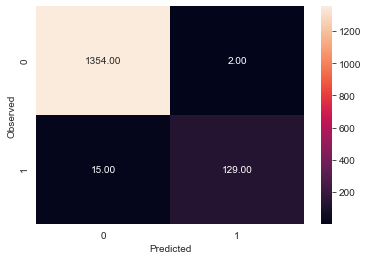

None


In [87]:
print('CONFUSION MATRIX OF RANDOM FOREST')
print(draw_cm(np_test_y,pred_3_test_x))

In [88]:
print("PRECISION: ",precision_score(np_test_y,pred_3_test_x))
print()
print("RECALL: ",recall_score(np_test_y,pred_3_test_x))
print()
print('Log loss: ',log_loss(np_test_y,pred_3_test_x))
print()
print("F1 SCORE: ",f1_score(np_test_y,pred_3_test_x))
print()
print("Roc Auc Score: ",roc_auc_score(np_test_y,pred_3_test_x))
print()

print()
print('Auc of ROC Curve: ',auc(fpr3,tpr3))
print()
print('Auc of precision & recall: ',auc(recall3,precision3))

PRECISION:  0.9847328244274809

RECALL:  0.8958333333333334

Log loss:  0.3914405319388956

F1 SCORE:  0.9381818181818182

Roc Auc Score:  0.9471792035398231


Auc of ROC Curve:  0.9962256227466404

Auc of precision & recall:  0.9784135115591314


### Naive Bayes

In [89]:
Naive_Bayes_model=GaussianNB()
Naive_Bayes_model.fit(x_train,y_train)

GaussianNB()

In [90]:
Naive_Bayes_pred = Naive_Bayes_model.predict(x_test)
Naive_Bayes_pred

array([1, 0, 0, ..., 0, 0, 0], dtype=int64)

In [91]:
Naive_Bayes_model.score(x_test,y_test)

0.8866666666666667

CONFUSION MATRIX OF NAIVE BAYES


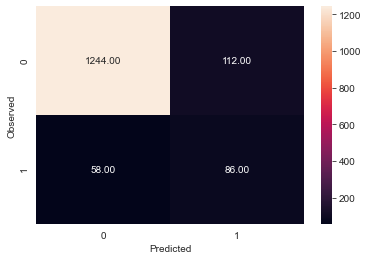

None


In [92]:
print('CONFUSION MATRIX OF NAIVE BAYES')
print(draw_cm(np_test_y,pred_5_test_x))

In [93]:
print("RECALL: ",recall_score(np_test_y,pred_5_test_x))
print()
print("PRECISION: ",precision_score(np_test_y,pred_5_test_x))
print()
print("F1 SCORE: ",f1_score(np_test_y,pred_5_test_x))
print()
print("Roc Auc Score: ",roc_auc_score(np_test_y,pred_5_test_x))
print()
print('Log loss: ',log_loss(np_test_y,pred_5_test_x))
print()
print()
print('Auc of ROC Curve: ',auc(fpr5,tpr5))
print()
print('Auc of precision & recall: ',auc(recall5,precision5))

RECALL:  0.5972222222222222

PRECISION:  0.43434343434343436

F1 SCORE:  0.5029239766081872

Roc Auc Score:  0.7573131760078663

Log loss:  3.9144543613646663


Auc of ROC Curve:  0.9293418141592921

Auc of precision & recall:  0.6083018563783765


###  KNeighbors Classifier

In [94]:
Kneighbour_model = KNeighborsClassifier(n_neighbors=5)
Kneighbour_model.fit(x_train, y_train)

KNeighborsClassifier()

In [95]:
Kneighbour_pred = Kneighbour_model.predict(x_test)
Kneighbour_pred

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [96]:
Kneighbour_model.score(x_test,y_test)

0.9193333333333333

CONFUSION MATRIX OF KNEIGHBORS CLASSIFIER MODEL


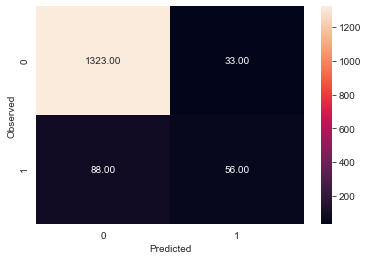

None


In [97]:
print('CONFUSION MATRIX OF KNEIGHBORS CLASSIFIER MODEL')
print(draw_cm(np_test_y,pred_4_test_x))

In [98]:
print("RECALL: ",recall_score(np_test_y,pred_4_test_x))
print()
print("PRECISION: ",precision_score(np_test_y,pred_4_test_x))
print()
print("F1 SCORE: ",f1_score(np_test_y,pred_4_test_x))
print()
print("Roc Auc Score: ",roc_auc_score(np_test_y,pred_4_test_x))
print()
print('Log loss: ',log_loss(np_test_y,pred_4_test_x))
print()
print('Auc of ROC Curve: ',auc(fpr4,tpr4))
print()
print('Auc of precision & recall: ',auc(recall4,precision4))

RECALL:  0.3888888888888889

PRECISION:  0.6292134831460674

F1 SCORE:  0.48068669527896996

Roc Auc Score:  0.6822763028515241

Log loss:  2.7861455536662603

Auc of ROC Curve:  0.8786386635529334

Auc of precision & recall:  0.5540726307325892


# Task:9
# Conclusion:

# BUSINESS REPORT

                    Imported all the necessary libraries and use them accordingly.
                    Imported Bank_Personal_Loan_Modelling dataset using pandas read_excel into banker, given dataset is categorical in the form .xlxs.
                    Dataset have integer datatypes and one float(no string datatypes.
                    No null values are found.
                    By statistical summary of dataset mean ,,min,max,std of each column is caluculated.Observed that column:'Experience' has some inappropriate values.
                    
                    Inappropiate valuesin 'Experience' are 52,these values are replaced by the median of appropriate values in 'Experience' by cleaning the dataset.
                    
                    Unique in each column is caluculated, and infered that, if count less that 5 are categorical columns.
                    Categorical columns=[Family,Education,Personal Loan,Securities Account,CD Account,Online,CreditCard]=7
                    People with zero mortgage=3462 ,people with zero credit card spending per month are 106.
                    Plotting the Distribution plot,histogram  for univariant and bivariant analysis.
                    Plotting the Countplot for Categorical columns.
                    Plotting Boxplot ,Violinplot for Bivariant analysis.
                    Used Heatmap for correlating.
                    Scatter plot ,pair plot (hue as Personal loan) for bivariant analysis.
                    Plotting Scatter plotting in 3D.
                    Removed unnecessary columns in dataset.
                    Using stratify methodology splited the dataset into train and test sets.
                    
                    
### Results:
                    Logistic Regression accuracy on np_train_x:   0.9523
                    Logistic Regression accuracy on np_test_x :   0.9493
                    precision                                 :  0.8148148148148148
                    recall                                    :  0.6111111111111112
                    Log loss                                  :  1.7499753319745444
                    Auc of ROC Curve                          :  0.9563718862667978
                    Auc of precision & recall                 :  0.8157979335898066
                    Classification report:
                               precision    recall  f1-score   support

                    class 0       0.96      0.99      0.97      1356
                    class 1       0.81      0.61      0.70       144

                    accuracy                          0.95      1500
                    macro avg     0.89      0.80      0.84      1500
                    weighted avg  0.95      0.95      0.95      1500
                    
                    Decision Tree Classifier accuracy on np_train_x  :  0.9954
                    Decision Tree Classifier accuracy on np_test_x   :  0.9840
                    PRECISION                                        :  0.910958904109589
                    RECALL                                           :  0.9236111111111112
                    Log loss                                         :  0.552627352162967 
                    Auc of ROC Curve                                 :  0.9650037897410684
                    Roc Auc Score                                    :  0.9570120452310719
                    Auc of precision & recall                        :  0.9364906916667595
                    F1 SCORE                                         :  0.9172413793103449
                    
                    Random Forest Classifier accuracy on np_train_x  :  0.9949
                    Random Forest Classifier accuracy on np_test_x   :  0.9887
                    PRECISION                                        :  0.9847328244274809
                    RECALL                                           :  0.8958333333333334
                    Log loss                                         :  0.3914405319388956
                    Auc of ROC Curve                                 :  0.9962256227466404
                    Roc Auc Score                                    :  0.9471792035398231
                    Auc of precision & recall                        :  0.9784135115591314
                    F1 SCORE                                         :  0.9381818181818182
                    
                    NAIVE BAYES accuracy on np_train_x               :  0.8823
                    NAIVE BAYES accuracy on np_test_x                :  0.8867
                    PRECISION                                        :  0.43434343434343436
                    RECALL                                           :  0.5972222222222222
                    Log loss                                         :  3.9144543613646663
                    Auc of ROC Curve                                 :  0.9293418141592921
                    Roc Auc Score                                    :  0.7573131760078663
                    Auc of precision & recall                        :  0.6083018563783765
                    F1 SCORE                                         :  0.5029239766081872

                    KNeighbors Classifier accuracy on np_train_x     :  0.9403
                    KNeighbors Classifier accuracy on np_test_x      :  0.9193
                    PRECISION                                        :  0.6292134831460674
                    RECALL                                           :  0.3888888888888889
                    Log loss                                         :  2.7861455536662603
                    Auc of ROC Curve                                 :  0.8786386635529334
                    Roc Auc Score                                    :  0.6822763028515241
                    Auc of precision & recall                        :  0.5540726307325892
                    F1 SCORE                                         :  0.48068669527896996

                    CONFUSION MATRIX OF LOGISTIC REGRESSION          :  array([[1336,   20],[  56,   88]])
                    CONFUSION MATRIX OF DECISION TREE                :  array([[1343,   13],[  11,   133]])               
                    CONFUSION MATRIX OF RANDOM FOREST                :  array([[1354,   02],[  15,   129]])
                    CONFUSION MATRIX OF NAIVE BAYES                  :  array([[1244,   112],[  58,   86]])
                    CONFUSION MATRIX OF KNEIGHBORS CLASSIFIER MODEL  :  array([[1323,   33],[  88,   56]])
### Random forest alogorithm gave the highest accuracy for train and test sets, with  less ( 1,0) value in confusion matrix.
### Least (1,0) value in confusion matrix is in Decision tree.